# Simple predictions with a trained model

In [21]:
# This needs to be imported because the model uses a custom classes that need to be registered
from src.sketch_detection_rcnn.roi_heads import SketchROIHeads  # noqa # pylint: disable=unused-import

In [22]:
import os
from src.utils.utils_json import read_json

models = [
    "quizzical_mayer",
    # "bold_mestorf",
    "clever_mahavira",
]

model_meta = {}

for model_name in models:
    filename = os.path.join("reports", f"{model_name}.json")
    model_meta = read_json(filename)

    if "model_name" not in model_meta:
        model_meta["model_name"] = model_meta

In [24]:
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_meta["config_file"])

# path to the model we just trained
cfg.MODEL.WEIGHTS = os.path.join("models", "model_name", "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4  # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [25]:
def count_classes(classes: list[int]) -> dict[int, int]:
    class_count = {}
    for key in classes:
        if key in class_count:
            class_count[key] += 1
        else:
            class_count[key] = 1

    return class_count

In [26]:
from src.dataset.dataset import read_dateset_from

validation_dataset = read_dateset_from(model_meta["training_data"], "test")

Ground truth


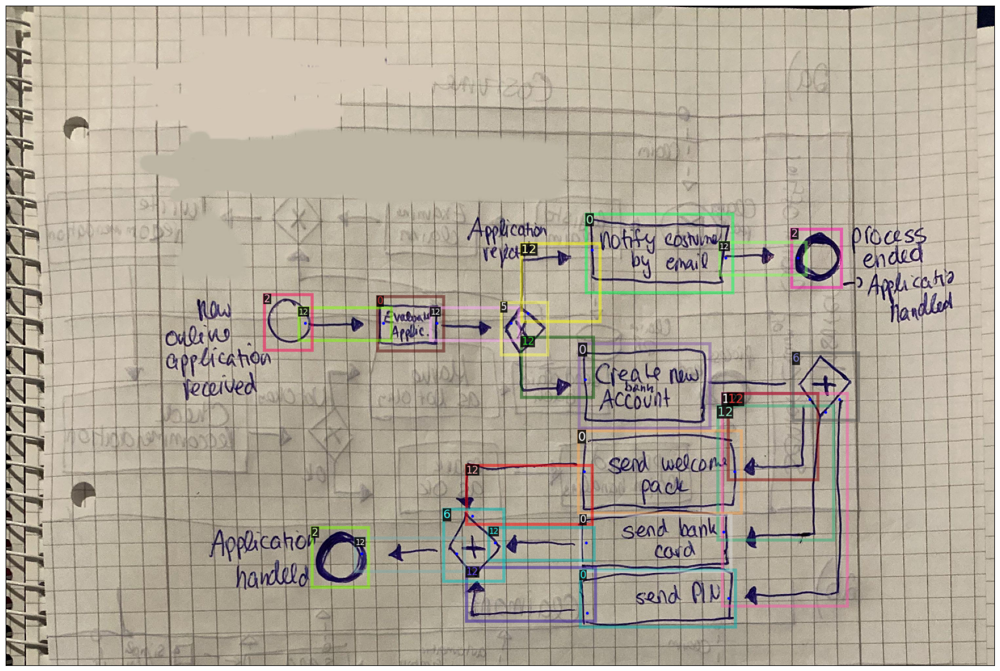

Predictions (quizzical_mayer)


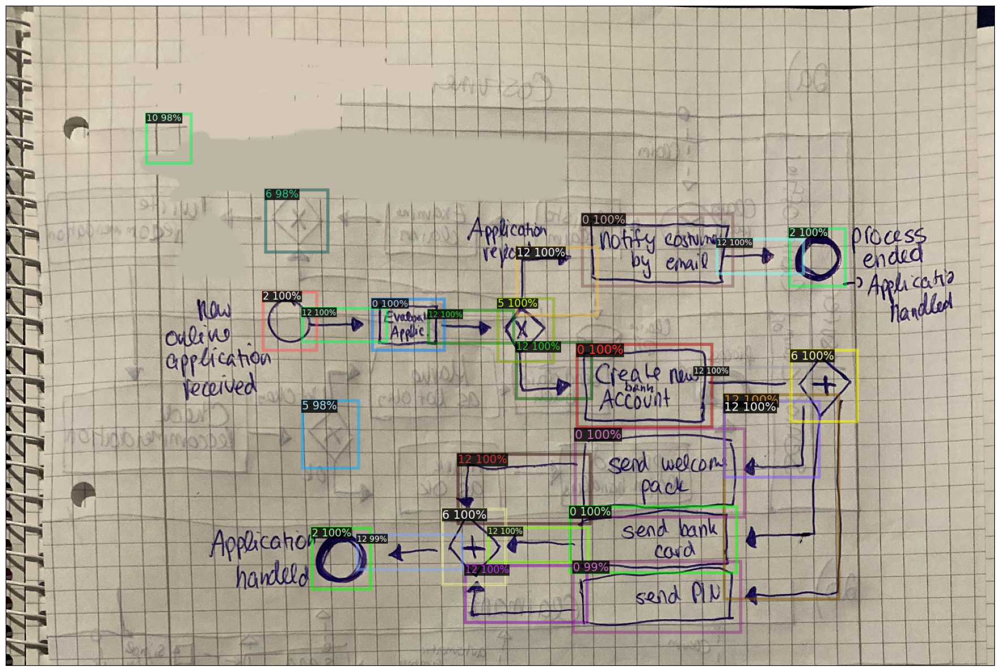

Predictions (clever_mahavira)


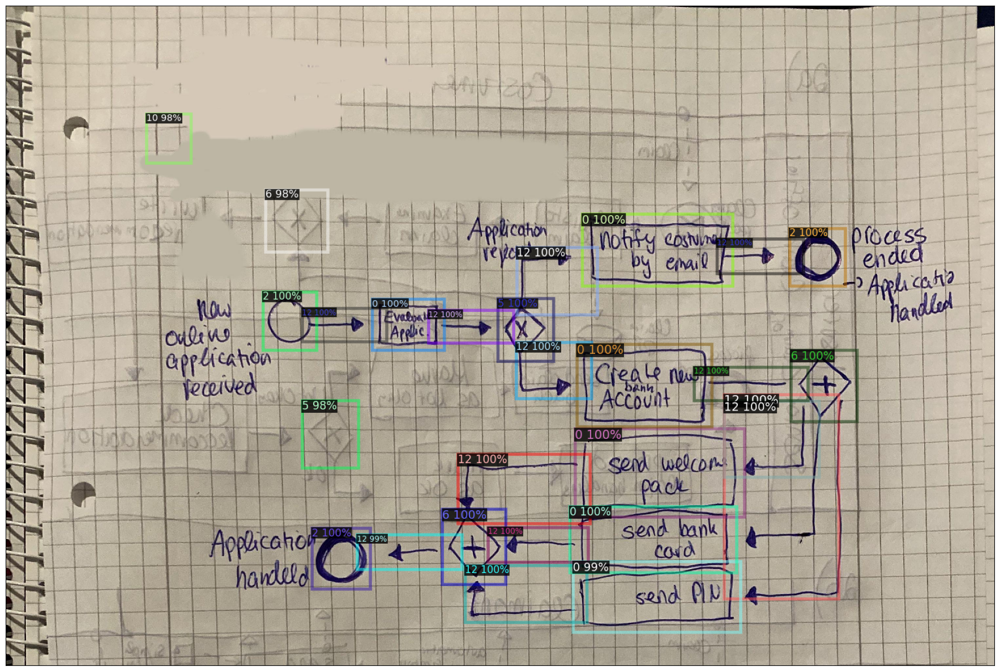

In [30]:
import cv2
from detectron2.utils.visualizer import Visualizer
from src.visualization.visualize import show_img

datapoint = validation_dataset[2]
im = cv2.imread(datapoint["file_name"])

# remove the colors of unsegmented pixels. This option is only available for segmentation models
visualizer = Visualizer(im, scale=0.5)

print("Ground truth")
gt_out = visualizer.draw_dataset_dict(datapoint)
show_img(gt_out.get_image())

for model in models:
    outputs = predictor(im)

    # remove the colors of unsegmented pixels. This option is only available for segmentation models
    visualizer = Visualizer(im, scale=0.5)

    print(f"Predictions ({model})")
    pred_out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    show_img(pred_out.get_image())